# Obstacle Avoidance using Neural Field : simulation

## Useful Functions

In [1]:
include("packages.jl")
using FFTW, ToeplitzMatrices, Roots, NLsolve, NNlib, Base, Statistics

In [2]:
function angle_wrt_h(v1,v2)
    ## compute the angle between the vector v2-v1 (v1-->v2) and the horizontal axis
    a=[1;0] # Horizontal axis
    b=[v2[1]-v1[1];v2[2]-v1[2]] #vector from v1 to v2
    
    dot = a[1]*b[1] + a[2]*b[2]      # cosine of the angle between the vector v2-v1 (v1-->v2) and the horizontal axis
    det = a[1]*b[2] - a[2]*b[1]      # sinethe angle between the vector v2-v1 (v1-->v2) and the horizontal axis
    θ = atan(det, dot)  # angle of the agent-to-ref vector wrt to horizontal axis
    return θ
end

angle_wrt_h (generic function with 1 method)

In [3]:
function distance(x1, x2)
    return sqrt((x1[1]-x2[1])^2 + (x1[2]-x2[2])^2)
end

distance (generic function with 1 method)

In [4]:
function atan2(y, x)
    if x == 0
        if y > 0
            return π / 2
        elseif y < 0
            return -π / 2
        else
            return 0
        end
    end
    angle = atan(y / x)
    if x < 0
        angle += π
    end
    return angle
end

atan2 (generic function with 1 method)

In [5]:
S_sh(x,x_sh)=(tanh(x-x_sh)-tanh(-x_sh))/(1-tanh(x_sh)^2)

S_sh (generic function with 1 method)

In [6]:
function compute_mean_angle(z)
    N = length(z)
    z = relu(z)
    if(norm(z)) != 0
        z = z/norm(z)
    end
    # Compute the sine and cosine components of each angle
    dev = 0.05
    angles = range(-pi + dev, pi - dev, N)
    sine_components = sin.(angles)
    cosine_components = cos.(angles)
    # Compute the weighted sine and cosine components
    weighted_sine = sum(z .* sine_components)
    weighted_cosine = sum(z .* cosine_components)
    # Compute the weighted mean angle
    θmean = atan2(weighted_sine, weighted_cosine)

    return θmean
end

compute_mean_angle (generic function with 1 method)

In [7]:
function plot_trajectory(sol, title, obstacles, target)
    gr(legendfontsize=15,labelfontsize=15)

    l= @layout[t{0.01h};
        [a{0.5w} b{0.5w}]
    ]

    # Simple plot
    plt_title = plot(title=title, grid = false, showaxis = false, xticks=false,yticks=false,margin=0px)
    pxy = plot((sol[1,:], sol[2, :]), lw=1.,lc=:gray30,xlabel=L"x", xlim=(-6,6), ylim=(-2, 11),
            ylabel=L"y", legend=false, title="Turtlebot trajectory",label = "trajectory")

    # Extract x and y coordinates from obstacles
    obstacles_x = [obst[1] for obst in obstacles]
    obstacles_y = [obst[2] for obst in obstacles]
    scatter!(obstacles_x, obstacles_y, markershape=:rect,markercolor=:red,markersize=15,
             label="Obstacles", legend=:bottomleft, legendfontsize=10)

    scatter!((target[1], target[2]), markershape=:circle, markercolor=:green,
                markersize=15, label="target")
    
    pcontrol = plot((sol.t,sol[4, :]),lw=1.,lc=:royalblue1,label=L"\omega", xlabel = L"t", title="Angular velocity")
    p_final = plot(plt_title,pxy, pcontrol, layout=l, margin=20px, size=(950, 450))
    return p_final
end

plot_trajectory (generic function with 1 method)

In [8]:
function plot_only_trajectory(sol, title, obstacles, target)

    gr(legendfontsize=15,labelfontsize=15)

    # Simple plot
    p = plot((sol[1,:], sol[2, :]), lw=1.,lc=:gray30,xlabel=L"x", xlim=(-5,5), ylim=(-2, 11),
            ylabel=L"y", title=title,label = "trajectory", size=(450, 450))

    # Extract x and y coordinates from obstacles
    obstacles_x = [obst[1] for obst in obstacles]
    obstacles_y = [obst[2] for obst in obstacles]
    scatter!(obstacles_x, obstacles_y, markershape=:rect,markercolor=:red,markersize=15,
             label="Obstacles", legend=:bottomleft, legendfontsize=10)

    scatter!((target[1], target[2]), markershape=:circle, markercolor=:green,
                markersize=15, label="target")
    
    
    return p

end

plot_only_trajectory (generic function with 1 method)

In [9]:
function plot_trajectory_and_velocity(sol, title, obstacles, target, v_vector)
    gr(legendfontsize=15,labelfontsize=15)

    l= @layout[t{0.01h};
        [a{0.5w} b{0.5w}]
    ]

    # Simple plot
    plt_title = plot(title=title, grid = false, showaxis = false, xticks=false,yticks=false,margin=0px)
    pxy = plot((sol[1,:], sol[2, :]), lw=1.,lc=:gray30,xlabel=L"x", xlim=(-6,6), ylim=(-2, 11),
            ylabel=L"y", legend=false, title="Turtlebot trajectory",label = "trajectory")

    # Extract x and y coordinates from obstacles
    obstacles_x = [obst[1] for obst in obstacles]
    obstacles_y = [obst[2] for obst in obstacles]
    scatter!(obstacles_x, obstacles_y, markershape=:rect,markercolor=:red,markersize=15,
             label="Obstacles", legend=:bottomleft, legendfontsize=10)

    scatter!((target[1], target[2]), markershape=:circle, markercolor=:green,
                markersize=15, label="target")
    

    downsample_factor = 10
    sol_t_downsampled = sol.t[1:downsample_factor:end]
    v_vector_downsampled = v_vector[1:downsample_factor:end]

    pcontrol = plot(sol_t_downsampled, lw=1.,lc=:royalblue1,v_vector_downsampled, xlabel = L"t", ylabel = L"v", ylims = (0,1.2* barv ), title = "Linear Velocity", label = "")
    
    p_final = plot(plt_title,pxy, pcontrol, layout=l, margin=20px, size=(950, 450))
    return p_final
end

plot_trajectory_and_velocity (generic function with 1 method)

In [10]:
function plot_map(obstacles, target, title)
    p = plot(title=title, xlabel=L"x", ylabel=L"y",xlim=(-5,5), ylim=(0, 10))

    # Extract x and y coordinates from obstacles
    obstacles_x = [obst[1] for obst in obstacles]
    obstacles_y = [obst[2] for obst in obstacles]
    scatter!(obstacles_x, obstacles_y, markershape=:rect,markercolor=:red,markersize=9, label="")

    scatter!((target[1], target[2]), markershape=:circle, markercolor=:green,label="",
                markersize=8)
    return p
end

plot_map (generic function with 1 method)

In [11]:
function anim_turtlebot(sol, title, obstacles, target, trajectory=false, step=50, nsteps=40)
    
    gr(legendfontsize=15,labelfontsize=15)

    l= @layout[t{0.01h};
        [a{0.5w} b{0.5w}]
    ]
    
    anim = @animate for i = nsteps*step:step:length(sol.t)
        plt_title = plot(title=title, grid = false, showaxis = false, xticks=false,yticks=false,margin=0px)
        if trajectory
            pxy = plot(sol[1,:], sol[2, :], lc=:gray30,lw=0.5, label="Trajectory", title="Turtlebot trajectory",xlabel=L"x", ylabel=L"y")
        else
            pxy = plot(title="Turtlebot trajectory", xlabel=L"x", ylabel=L"y")
        end

        obstacles_x = [obst[1] for obst in obstacles]
        obstacles_y = [obst[2] for obst in obstacles]
        scatter!(obstacles_x, obstacles_y, markershape=:rect,markercolor=:red,markersize=15,
             label="Obstacles", legend=:topright, legendfontsize=10, xlim=(-5, 5), ylim=(-1, 11),)

        scatter!((target[1], target[2]), markershape=:circle, markercolor=:green,
                markersize=15, label="target")

        scatter!((sol[1,i], sol[2, i]), markershape=:circle, markercolor=:blue, markersize=12, label="agent")

        if i<length(sol.t)-4*step
            plot!((sol[1,i:i+4*step], sol[2, i:i+4*step]), lw=2,lc=:blue, label="")
        end
        
        pcontrol = plot(title="Control input")
        if i>nsteps*step && i<length(sol.t)-step
        pcontrol = plot((sol.t[i-nsteps*step:i+step],sol[4,i-nsteps*step:i+step]),
                xlim=(sol.t[i-nsteps*step],sol.t[i+step]), ylim=(-2, 2),
                lw=1.,lc=:red,label=L"v_\theta", xlabel = L"t", title="Control input", up_margin=150px)
        end
        plot(plt_title, pxy, pcontrol, layout=l, margin=20px, size=(1000, 500))
    end
    
    return anim
    
end

anim_turtlebot (generic function with 4 methods)

## TurtleBot and Neural Field Dynamics

### Simulate the LiDar

In [12]:
function compute_inputs(position, obstacles, N, radius)
    max_dist = 10
    x, y, θ = position
    dev = 0.05
    angles = range(-pi + dev, pi - dev, N)
    I = zeros(N)

    if length(obstacles) == 0
        I .= max_dist
        return I
    end
    
    for (i, angle) in enumerate(angles)
        dist = max_dist
        for d in 0:0.1:max_dist
            point = [x + d * cos(θ + angle), y + d * sin(θ + angle)]
            point_obstacle_distances = [distance(point, obstacle) for obstacle in obstacles]
            min_distance = minimum(point_obstacle_distances)
            
            if min_distance <= radius
                dist = d
                break
            end
        end
        I[i] = dist
    end

    return I
end

compute_inputs (generic function with 1 method)

 ### Simulate TurtleBot Dynamics 

TurtleBot dynamics :

* $\frac{\partial x}{\partial t} = v \cdot cos(\theta)$
* $\frac{\partial y}{\partial t} = v \cdot sin(\theta)$
* $\frac{\partial \theta}{\partial t} = \omega $



And Neural Field Dynamics : \
$\dot{z}_i = -z_i + S\left( \sum_{j=1}^N A_{ij} z_j + I(t) \right)$

Now everything depends on the way the input $I(t)$ are calculated and the state of the neural field $z$ is mapped to the velocities $\omega$ and $v$.

In [13]:
function nf_turtlebot!(du,u,p,t)

    #NEURAL FIELD PARAMETERS
    A = p[1]
    τ_neural = p[2]
    kbar = p[3]

    barv = p[4]
    f = p[5]
    w = p[6]
    target_pose = p[7]
    obstacles = p[8]
    obstacle_radius = p[9]

    τ_control = p[10]
    threshold = p[11]
    linear_mode = p[12]
    k_angular = p[13]

    target_excitation = p[14]
    obstacle_inhibition = p[15]

    v_vector = p[18]
    k_0 = p[19]

    N = size(A)[1]

    x=u[1]
    y=u[2]
    θ=u[3]
    ω=u[4]

    #UNICYCLE DYNAMICS
    z = u[end-N+1:end]
    
    v = compute_output_linear(z, barv, linear_mode)
    push!(v_vector, v)

    du[1]= v*cos(θ)
    du[2]= v*sin(θ)
    du[3]= ω

    

    #CONTROL DYNAMICS
    #The angle we want to reach is dictated by the current state of the neural field
    
    
    du[4] = compute_output_angular(z, ω , θ, τ_control, k_angular, k_0)

    #NEURAL FIELD DYNAMICS

    I = compute_inputs([x;y;θ], obstacles, N, obstacle_radius)
    I = process_input(I,f,w, [x,y,θ], target_pose, target_excitation, obstacle_inhibition, threshold)
    
    # Neural Field Dynamics using matrix multiplication
    neural_inputs = kbar * A * u[end-N+1:end]
    du[end-N+1:end] .= -u[end-N+1:end] .+ S_sh.(I .+ neural_inputs, 1.0)

end 

function nf_turtlebot_σ!(du,u,p,t)
    
    fill!(du, 0.0)
    du[1] = p[16]
    du[2] = p[16]
    du[3] = p[17]

end

nf_turtlebot_σ! (generic function with 1 method)

## Input Processing

For the inputs, the input should be high when the distance is low : 
* Inverse Distance : $input = \frac{1}{dist}$ \
 Sensitive to very close obstacles but can be unstable for extremely small distances.

* Linear Function : $input = max\_dist - dist$ \
Simple and provides a straightforward decrease with distance. 

* Exponential Decay : $input = e^{- \alpha \cdot dist}$\
Smooth and rapidly decreasing response

* Hyperbolic Tangent : $input = tanh \left( \frac{max\_dist - dist}{k} \right) $\
Bounded response that might be useful for avoiding extreme values. 

* Gaussian Function : $input = exp \left( -\frac{dist^2}{2 \sigma^2} \right)$\
Between the exponential decay and the hyperbolic tangent. 

* Shifted sigmoid Function : $input = \frac{1}{1 + exp(-k \cdot (dist - shift))}$\
Introduce a notion of "threshold"

* Step function : $input = constant$ if $dist < threshold$\
Like in the paper


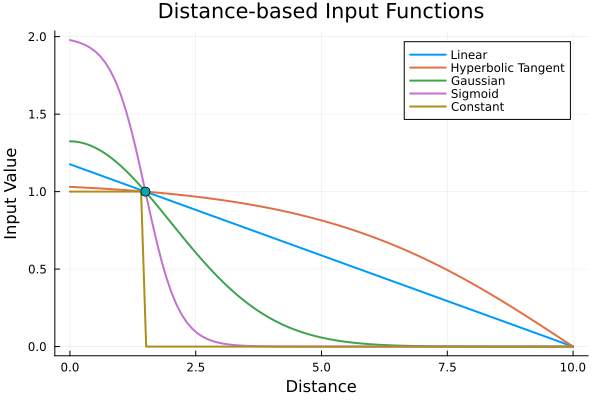

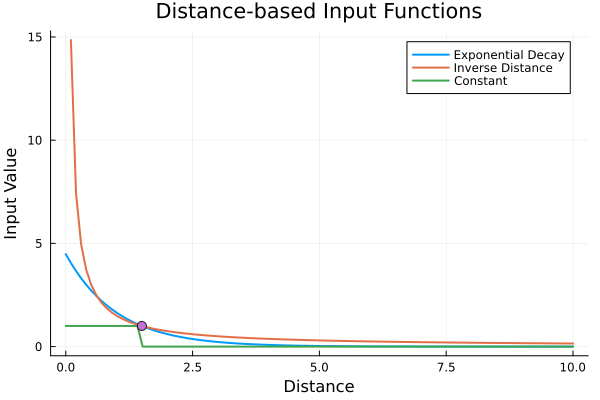

In [14]:
# Define the distance to the obstacle and the maximum distance
max_distance = 10.0
alpha = 1.0
σ = 2.0
scale = 5.0
k = -3.0
threshold = 1.5

# Inverse Distance
inverse_distance_input(distance) = threshold / (distance)

# Linear Function
linear_input(distance) = (1/(max_distance-threshold))*(max_distance - distance)

# Exponential Decay
exp_decay_input(distance) = (1/exp(-alpha*threshold))*exp(-alpha * distance)

# Gaussian Function
gaussian_input(distance) = (1/exp(-threshold^2/(2*σ^2)))*exp(-distance^2 / (2 * σ^2))

# Hyperbolic Tangent
tanh_input(distance) = (1/tanh((max_distance-threshold)/scale))*tanh((max_distance - distance) / scale)

#Shifted sigmoid
sigmoid_input(distance) = 2.0/(1 + exp(-k*(distance - threshold)))

#Constant Input
step_input(distance) = (distance < threshold)*1 + 0


# Define range of distances from 0 to 10
distances = range(0, stop=max_distance, length=100)

# Create a plot

p1 =  plot(distances, linear_input, label="Linear", linewidth=2)
plot!(distances, tanh_input, label="Hyperbolic Tangent", linewidth=2)
plot!(distances, gaussian_input, label="Gaussian", linewidth=2)
plot!(distances, sigmoid_input, label="Sigmoid", linewidth=2)
plot!(distances, step_input, label="Constant", linewidth=2)
plot!(xlabel = "Distance", ylabel= "Input Value", title = "Distance-based Input Functions", legend = :topright)
scatter!((threshold, 1.0), label = "", markershape=:circle, markersize=:5)


p2 = plot(distances, exp_decay_input, label="Exponential Decay", linewidth=2)
plot!(distances, inverse_distance_input, label="Inverse Distance", linewidth=2)
plot!(xlabel = "Distance", ylabel= "Input Value",distances, step_input, label="Constant", linewidth=2, title = "Distance-based Input Functions", legend = :topright)
scatter!((threshold, 1.0), label = "", markershape=:circle, markersize=:5)

# Display the plots
#savefig(p1,"input_functions_1.png")
#savefig(p2,"input_functions_2.png")
display(p1)
display(p2)

But the input should also be mulitplied by a weight depending on the angle w.r.t. the robot, since obstacles that are in front of it are less important than obstacles behind : 
$$
input = f(dist)\cdot weight(\theta)
$$

The weight should be higer for obstacles in front of it. Several possibilites : 

* Cosine weight : $weight(\theta) = \left( \frac{1 + cos(\theta)}{2} \right)^n$\
Steepness can be tuned by $n$.
* Gaussin Weight : $weight(\theta) = exp(- \frac{\theta^2}{2 \sigma^2})$\
Steepness can be tuned by $\sigma$.


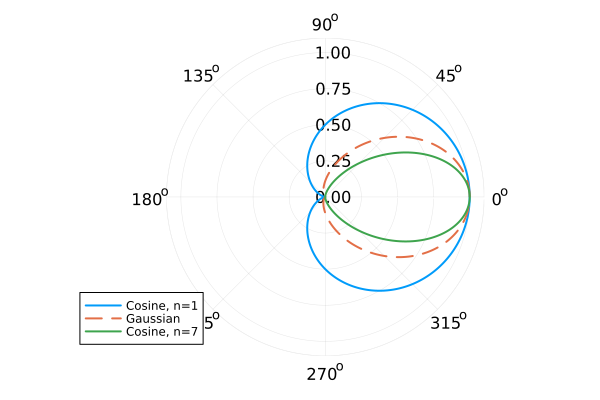

In [15]:
# Define parameters
max_distance = 10.0
sigma_angle = 0.75  # Standard deviation for Gaussian weighting

# Create a range of angles from 0 to 2π
angles = -π:0.01:π

# Define the weighting functions
cosine_weighting(θ) = ((1 + cos(θ)) / 2)^1
gaussian_weighting(θ) = exp(-θ^2 / (2 * sigma_angle^2))
cosine_weighting_2(θ) = ((1 + cos(θ)) / 2)^7

# Compute the radii based on the weighting functions
cosine_radii = [cosine_weighting(θ) for θ in angles]
gaussian_radii = [gaussian_weighting(θ) for θ in angles]
cosine_radii_2 = [cosine_weighting_2(θ) for θ in angles]

# Create a polar plot
p = plot(proj=:polar, xlabel="Angle (rad)", ylabel="Radius", legend=:bottomleft)

# Plot the radii with the angles
plot!(angles, cosine_radii, label="Cosine, n=1", linewidth=2)
plot!(angles, gaussian_radii, label="Gaussian", linewidth=2, linestyle=:dash)
plot!(angles, cosine_radii_2, label="Cosine, n=7", linewidth=2)

# Display the plot
#savefig(p, "angular_weights.png")
display(p)

**Two possibilities** : 
* **the robot should only avoid obstacle** : Then neural field should be high when close to obstacles, and a controller dynamics should be found in order to avoid these bumps, i. e. find "holes" in the neural field state. 

* **the robot should track a given target** : Then neural field should be such that obtacles inhibits some direction while directions close to the target are excitated. No need for a real controller dynamics since the angle that needs to be tracked is the maximum of the neural field. To track the target, the robot needs to know its own position : either continuously integrate motors infos, either evolve in a known map, either find a kind of "stimuli". 

In [17]:
function process_input(raw_inputs, f, w, robot_pose, target_pose, target_excitation, obstacle_inhibition, threshold)

    max_distance = 10.0

    N = length(raw_inputs)
    processed_inputs = zeros(N)
    weights = zeros(N)

    alpha = 1.0
    σ = 2.5
    scale = 5.0
    k = -3.0
    max_tanh = 1/tanh((max_distance-threshold)/scale)

    n = 1
    sigma_angle = 0.75

    Ktgt = 2.0

    #OBSTACLE INHIBITION

    #DISTANCE PROCESSING
    if f == "linear"
        processed_inputs = -(1/(max_distance-threshold))*(max_distance .- raw_inputs)
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif  f == "inverse"
        processed_inputs = -threshold ./ (raw_inputs)
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "exp"
        processed_inputs = -(1/exp(-alpha*threshold))*exp.(-alpha * raw_inputs)
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "gaussian"
        processed_inputs = -(1/exp(-threshold^2/(2*σ^2)))*exp.(-raw_inputs.^2 / (2 * σ^2))
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "tanh"
        processed_inputs = -max_tanh*tanh.((max_distance .- raw_inputs) / scale)
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "sigmoid"
        processed_inputs = -2 ./ (1 .+ exp.( -k * (raw_inputs .- threshold)))
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "step"
        processed_inputs = -(raw_inputs .< threshold)*1.0 .+ 0
        processed_inputs = processed_inputs*obstacle_inhibition

    elseif f == "composite"
        for i in 1:1:N
            if raw_inputs[i] < threshold 
                processed_inputs[i] =  threshold/raw_inputs[i]
            else
                processed_inputs[i] = (1/exp(-threshold^2/(2*σ^2)))*exp(-raw_inputs[i]^2 / (2 * σ^2))
            end
        end
        processed_inputs = -processed_inputs*obstacle_inhibition

    else 
        processed_inputs = -(raw_inputs .< threshold)*1 .+ 0
        processed_inputs = processed_inputs*obstacle_inhibition
    end

    #ORIENTATION WEIGHTING
    dev = 0.05
    angles = range(-pi + dev, pi - dev, N)
    if w == "cosine"
        weights = ((1 .+ cos.(angles)) / 2).^n

    elseif w == "gaussian"
        weights = exp.(-angles.^2 / (2 * sigma_angle^2))

    else 
        weights = ones(N)
    end 

    processed_inputs = processed_inputs .* weights


    #TARGET EXCITATION
    x, y, θ = robot_pose 
    xtgt, ytgt = target_pose

    θtgt = angle_wrt_h([x;y], [xtgt; ytgt])
    Δtgt = θ - θtgt

    processed_inputs = processed_inputs .+ 0.5*target_excitation*(cos.(Δtgt .+ angles) .+ 1)

    return processed_inputs
end 

process_input (generic function with 1 method)

## Output Processing 

In [18]:
function compute_output_linear(z, barv, mode)

    if mode == "active"
        β = 3
        shift = 1.2

        #neural_max = maximum(z)
        z = relu(z)
        neural_max = mean(z)
        goal_velocity = barv/(1 + exp(-β*(neural_max-shift)))

        return goal_velocity

    else
        return barv
    end
    
end

compute_output_linear (generic function with 1 method)

In [19]:
function compute_output_angular(z, ω, θ, τ, k_angular, k_0)

    neural_max_index = argmax(z)

    N = length(z)
    dev = 0.05
    angles = range(-pi + dev, pi - dev, N)
    θtgt = angles[neural_max_index]

    ω_dot = 1/τ *(-ω + tanh(k_0*ω + k_angular*sin(θtgt)))

    return ω_dot

end

compute_output_angular (generic function with 1 method)

## Simulate

### Construction of A matrix

[0.20653625302992937, 0.14818107237361877, 0.0744316148426165, 0.03851575839563159, 0.019328549351016043, 0.01001793528832492, 0.0036590577590086128, 0.0004178615641413476, -0.0024616045361125004, -0.0038071009028551174, -0.0054190596040954294, -0.0060122542042517066, -0.00705841387418237, -0.0073020829886658355, -0.008056555978476494, -0.00812000641637229, -0.008706647110583032, -0.008670825536023693, -0.009151800129914667, -0.009059412059768046, -0.009468453018845337, -0.009343872930060091, -0.00970038850343738, -0.00955846532588002, -0.00987412485897108, -0.009724420555792847, -0.010006472021480141, -0.009855446355304226, -0.010108495625828936, -0.009960697514781278, -0.010187713832191466, -0.01004646224672262, -0.010249372143515305, -0.010117160974802992, -0.010297212650377984, -0.010175959658200265, -0.010333953931041508, -0.010225158220882234, -0.0103615990434294, -0.01026644306667591, -0.010381637915627701, -0.010301054802168867, -0.010395182847908625, -0.010329901463427786, -0.

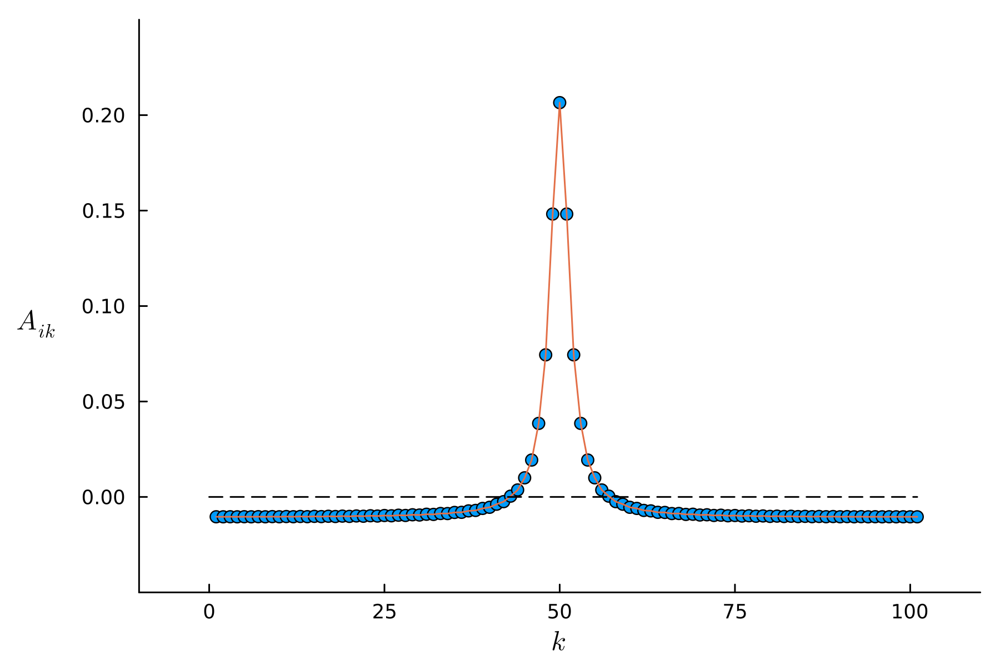

In [22]:
#CONSTRUCTION OF A MATRIX 
Nspace = 101 #should be odd such that 0 is comprised
hatc = zeros(Nspace)
for k = 2:1:div(Nspace,2)
    hatc[k] = exp(-(k-2)/10)
    hatc[Nspace-k+2] = exp(-(k-2)/10)
end
c = real.(ifft(hatc))
print(c) #print c such that it can be used in "NFDE.cpp" node
A=Matrix(Toeplitz(c,c))
p3=scatter(A[:,div(Nspace,2)])
plot!(A[:,div(Nspace,2)])
plot!([0;Nspace],[0;0],lc=:black,ls=:dash)
plot!(xlabel=L"k", grid=false, ylabel=L"A_{ik}",yguidefontrotation=-90,
    legend=false,leftmargin=25px,xlims=(-10,110),ylims=(-0.05,0.25),dpi=300)

#savefig(p3, "A.png")

### Maps construction 

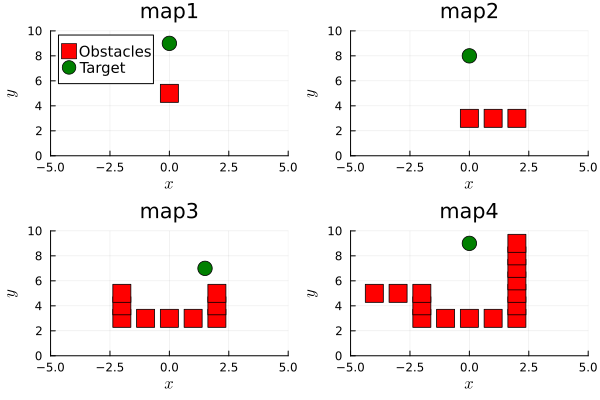

In [23]:
#Define different maps

map1 = [[[0,5]],[0,9], "map1"]
map2 = [[[0,3], [1, 3], [2,3]],[0,8], "map2"]
map3 = [[[0,3], [1, 3], [2,3], [-1, 3], [-2, 3], [-2, 4], [-2, 5], [2,4], [2,5]], [1.5, 7], "map3"]
map4 = [[[0,3], [1, 3], [2,3], [-1, 3], [-2, 3], [-2, 4], [-2, 5], [2,4], 
        [2,5], [2,6], [2,7], [2,8],[2,9],[-3,5], [-4,5]], [0, 9], "map4"]

#Additional map to put the agent in a strong inhibition situation (for linear velocity control)
map5 = [[[1.5, 4], [-1.5,4], [-2.5,4], [2.5,4], [2.5, 5], [-2.5,5], [2.5,6], [-2.5, 6], [2.5, 7]
,[-2.5,7], [2.5, 8], [-2.5,8], [1.5,8], [-1.5,8], [0.5,8], [-0.5,8]],[0,10], "map5"]

maps = [map1, map2, map3, map4]

# Initialize an empty list to collect the plots
plots = []

# Iterate over the maps and collect the plots
for i in 1:1:length(maps)
    map = maps[i]
    p = plot_map(map[1], map[2], map[3])
    push!(plots, p)
end

rows = ceil(Int, length(maps)/2)
cols = ceil(Int, 2)
# Display all collected plots in a single plot with subplots
p = plot(plots..., layout = (rows, cols))

# Add dummy scatter plots for the legend
scatter!([NaN], [NaN], markershape = :rect, markercolor = :red, markersize = 9, label = "Obstacles")
scatter!([NaN], [NaN], markershape = :circle, markercolor = :green, markersize = 8, label = "Target")

# Display the plot with the legend
plot!(legend=:topleft, legendfontsize=10)
#savefig(p, "maps.png")
display(p)

### Simulation

In [24]:
#SIMULATE 

####################################################################################################################

f = "step"                    #chose between "step", "linear", "inverse", "gaussian", "sigmoid", "tanh", "exp" or "composite"
weight_mode = "no"            #chose between "no", "cosine" and "gaussian"
linear_mode = "inactive"      #chose between "active" or "inactive"

my_map = maps[4]               # chose the map (4 possible maps)
#my_map = map5 

target_excitation = 1.2       #tune the inhibtion/excitation of the model
obstacle_inhibition = 1.0

threshold = 1.0               #tune the threshold of the input function

k_0 = 0.0

########################################################################################################################

Tfinal= 250.0
tspan=(0.0, Tfinal)

τ_neural = 0.001
kbar = 0.75

barv = 0.1

target_pose = my_map[2]
obstacles = my_map[1]
obstacle_radius = 1.0

τ_control = 0.1

k_angular = 5.0

σx = 0.025
σθ = 0.025

v_vector = []

p = (A, τ_neural, kbar, barv, f, weight_mode, target_pose, obstacles, obstacle_radius, τ_control, threshold, linear_mode,
     k_angular, target_excitation, obstacle_inhibition, σx, σθ, v_vector, k_0)

x0 = [0.0;-1.5;pi/2;0.0;zeros(Nspace)]

prob = SDEProblem(nf_turtlebot!, nf_turtlebot_σ!, x0, tspan, p)
sol = solve(prob, EM(), dt=1e-2, saveat=0.01);
push!(v_vector, v_vector[end])
normcontrol=norm(sol[4,:])
println("Sent control signal: $normcontrol")

Sent control signal: 95.30568795601584


┌ Warning: Using arrays or dicts to store parameters of different types can hurt performance.
│ Consider using tuples instead.
└ @ SciMLBase C:\Users\bilou\.julia\packages\SciMLBase\szsYq\src\performance_warnings.jl:32


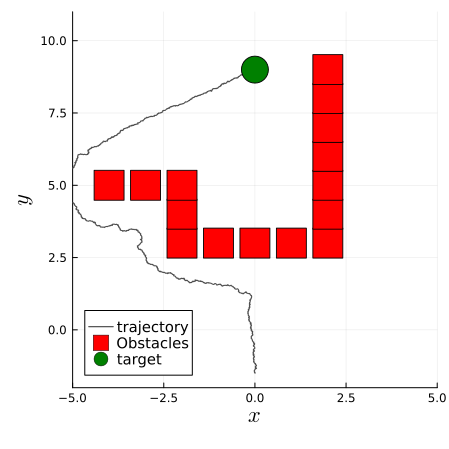

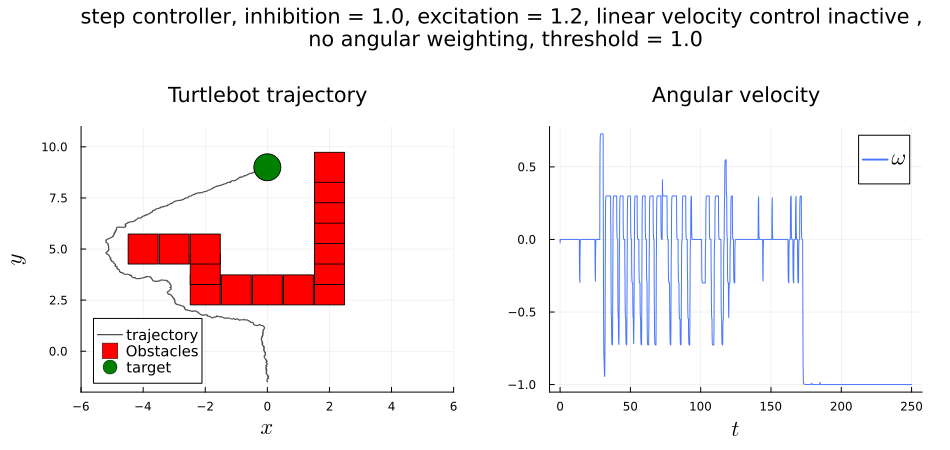

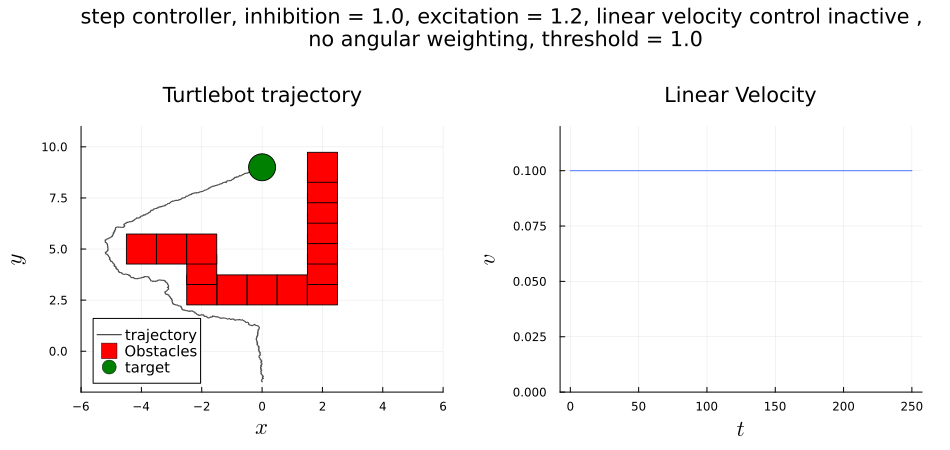

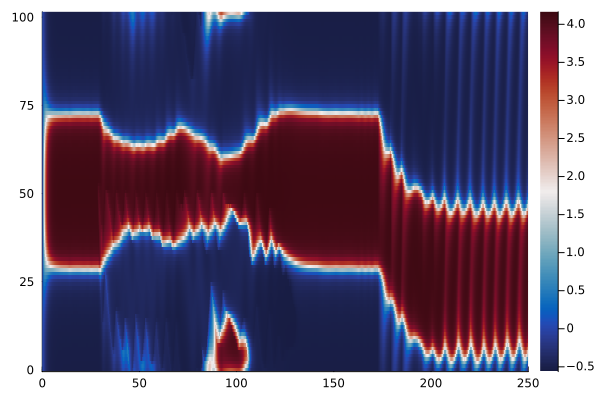

[ Info: Saved animation to c:\Users\bilou\OneDrive\Documents\Ecole\MASTER 1\Q2\Brain Inspired Computing\projet\Julia simulations\turtlebot.gif


Plots.AnimatedGif("c:\\Users\\bilou\\OneDrive\\Documents\\Ecole\\MASTER 1\\Q2\\Brain Inspired Computing\\projet\\Julia simulations\\turtlebot.gif")
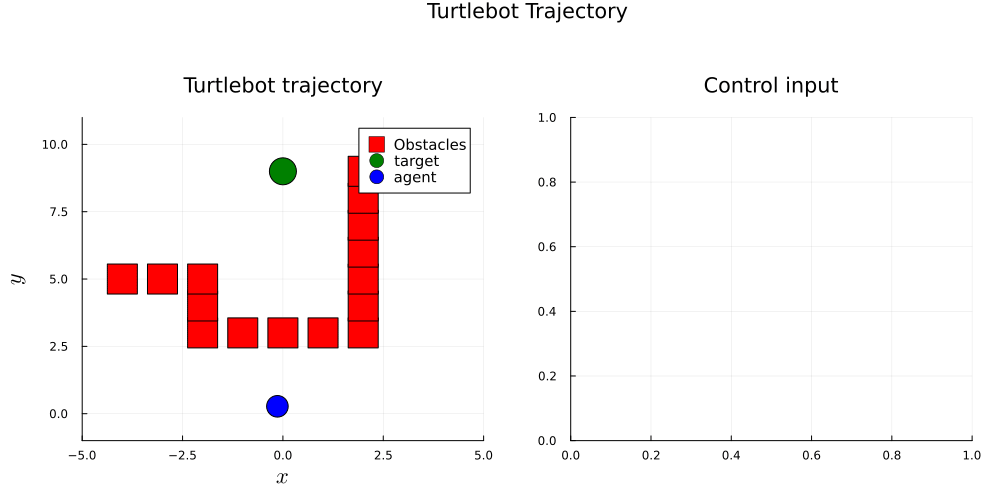

In [25]:
# PLOTS

#TRAJECTORY ONLY

traj = plot_only_trajectory(sol, "", obstacles, target_pose)
display(traj)
#savefig(traj, "cosine_map4.png")

#TRAJECTORY WITH ANGULAR VELOCITY

p = plot_trajectory(sol, " $(f) controller, inhibition = $(obstacle_inhibition), excitation = $(target_excitation), linear velocity control $(linear_mode) , \n $(weight_mode) angular weighting, threshold = $(threshold)", obstacles, target_pose)
display(p)
#savefig(p, "composite_simu.png")

#TRAJECTORY WITH LINEAR VELOCITY

p3 = plot_trajectory_and_velocity(sol, " $(f) controller, inhibition = $(obstacle_inhibition), excitation = $(target_excitation), linear velocity control $(linear_mode) , \n $(weight_mode) angular weighting, threshold = $(threshold)", obstacles, target_pose,  v_vector) 
#savefig(p3, "linear_velocity_mean_map1.png")
display(p3)

#HEATMAP OF THE NEURAL FIELD STATE

p2=heatmap(sol.t,[range(0,Nspace,length=Nspace)],[sol[5:4+Nspace,:]], c = :balance)
display(p2)
#savefig(p2, "linear_heatmap.png")

#ANIMATION

anim = anim_turtlebot(sol, "Turtlebot Trajectory", obstacles, target_pose)
gif(anim, "turtlebot.gif", fps = 60)